<a href="https://colab.research.google.com/github/anhb8/ML-Project-Part-2/blob/main/ML_Project_Part_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import files
files.upload()

Saving weatherHistory.csv to weatherHistory.csv


{'weatherHistory.csv': b'Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary\r\n2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222222222221,7.3888888888888875,0.89,14.1197,251.0,15.826300000000002,0.0,1015.13,Partly cloudy throughout the day.\r\n2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355555555555558,7.227777777777776,0.86,14.2646,259.0,15.826300000000002,0.0,1015.63,Partly cloudy throughout the day.\r\n2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377777777777778,9.377777777777778,0.89,3.9284000000000003,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.\r\n2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.28888888888889,5.944444444444446,0.83,14.1036,269.0,15.826300000000002,0.0,1016.41,Partly cloudy throughout the day.\r\n2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755555555555553,6.977777777777779,0.83,11.044

In [2]:
import pandas as pd
import seaborn as sns
import numpy as np 
import matplotlib.pyplot as plt

df = pd.read_csv('weatherHistory.csv')
df

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.
...,...,...,...,...,...,...,...,...,...,...,...,...
96448,2016-09-09 19:00:00.000 +0200,Partly Cloudy,rain,26.016667,26.016667,0.43,10.9963,31.0,16.1000,0.0,1014.36,Partly cloudy starting in the morning.
96449,2016-09-09 20:00:00.000 +0200,Partly Cloudy,rain,24.583333,24.583333,0.48,10.0947,20.0,15.5526,0.0,1015.16,Partly cloudy starting in the morning.
96450,2016-09-09 21:00:00.000 +0200,Partly Cloudy,rain,22.038889,22.038889,0.56,8.9838,30.0,16.1000,0.0,1015.66,Partly cloudy starting in the morning.
96451,2016-09-09 22:00:00.000 +0200,Partly Cloudy,rain,21.522222,21.522222,0.60,10.5294,20.0,16.1000,0.0,1015.95,Partly cloudy starting in the morning.


In [3]:
df.dtypes

Formatted Date               object
Summary                      object
Precip Type                  object
Temperature (C)             float64
Apparent Temperature (C)    float64
Humidity                    float64
Wind Speed (km/h)           float64
Wind Bearing (degrees)      float64
Visibility (km)             float64
Loud Cover                  float64
Pressure (millibars)        float64
Daily Summary                object
dtype: object

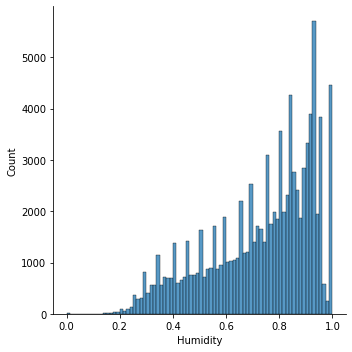

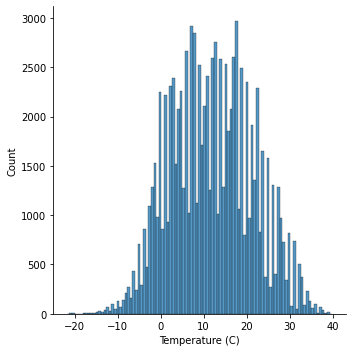

In [4]:
#Distribution plot
sns.displot(df,x="Humidity")
sns.displot(df,x="Temperature (C)")

In [5]:
#Drop missing values
df.isna().sum()
df=df.dropna()

#Drop duplicate values
df=df.drop_duplicates()

#Drop unnecessary columns
df=df.drop(['Formatted Date','Apparent Temperature (C)','Loud Cover','Daily Summary'],axis=1)




In [6]:
#One hot enconding
from sklearn import preprocessing
oh = preprocessing.OneHotEncoder()
df1=df.copy()
df1=pd.get_dummies(df1)

df1



,Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Summary_Breezy,Summary_Breezy and Dry,Summary_Breezy and Foggy,Summary_Breezy and Mostly Cloudy,...,Summary_Partly Cloudy,Summary_Rain,Summary_Windy,Summary_Windy and Dry,Summary_Windy and Foggy,Summary_Windy and Mostly Cloudy,Summary_Windy and Overcast,Summary_Windy and Partly Cloudy,Precip Type_rain,Precip Type_snow
0,9.472222,0.89,14.1197,251.0,15.8263,1015.13,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
1,9.355556,0.86,14.2646,259.0,15.8263,1015.63,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
2,9.377778,0.89,3.9284,204.0,14.9569,1015.94,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,8.288889,0.83,14.1036,269.0,15.8263,1016.41,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
4,8.755556,0.83,11.0446,259.0,15.8263,1016.51,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96448,26.016667,0.43,10.9963,31.0,16.1000,1014.36,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
96449,24.583333,0.48,10.0947,20.0,15.5526,1015.16,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
96450,22.038889,0.56,8.9838,30.0,16.1000,1015.66,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
96451,21.522222,0.60,10.5294,20.0,16.1000,1015.95,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0


In [7]:
#Aggregation columns
df['Mean']=df.groupby('Precip Type')['Temperature (C)'].transform('mean')
df['Min']=df.groupby('Summary')['Temperature (C)'].transform('min')
df['Max']=df.groupby('Summary')['Temperature (C)'].transform('max')
df['Standard Deviation']=df.groupby('Summary')['Temperature (C)'].transform('std')



In [28]:
x_data=df1.drop(['Temperature (C)'],axis=1)
x_data

y_data=df1['Temperature (C)'] 
y_data



0         9.472222
1         9.355556
2         9.377778
3         8.288889
4         8.755556
           ...    
96448    26.016667
96449    24.583333
96450    22.038889
96451    21.522222
96452    20.438889
Name: Temperature (C), Length: 95912, dtype: float64

In [24]:
#Scale data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(x_data)

scaled = scaler.transform(x_data)
scaled

array([[ 0.79276051,  0.47871562,  0.59130513, ..., -0.02643947,
         0.35458102, -0.35458102],
       [ 0.63947724,  0.49965352,  0.66580846, ..., -0.02643947,
         0.35458102, -0.35458102],
       [ 0.79276051, -0.99391611,  0.15359806, ..., -0.02643947,
         0.35458102, -0.35458102],
       ...,
       [-0.89335546, -0.26341632, -1.46684938, ..., -0.02643947,
         0.35458102, -0.35458102],
       [-0.68897776, -0.04007881, -1.55997854, ..., -0.02643947,
         0.35458102, -0.35458102],
       [-0.63788334, -0.71241778, -1.38303313, ..., -0.02643947,
         0.35458102, -0.35458102]])

In [83]:
#Split data into a test and training set, with 10% data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(scaled, y_data, test_size = 0.1)



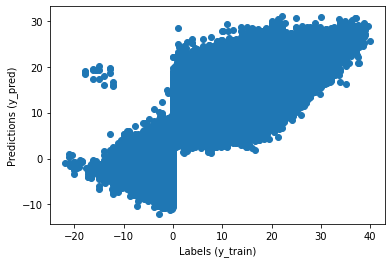

In [60]:
#Linear Regression

from sklearn.linear_model import LinearRegression
reg = LinearRegression()
reg.fit(x_train, y_train)

y_pred = reg.predict(x_train)
plt.scatter(y_train, y_pred)
plt.xlabel('Labels (y_train)')
plt.ylabel('Predictions (y_pred)')
plt.show()


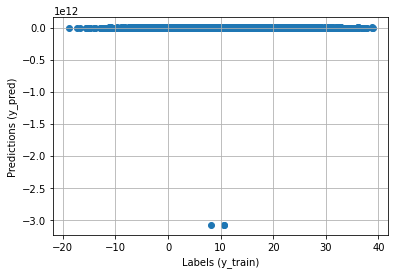

In [75]:
#SGD Regression
from sklearn.linear_model import SGDRegressor

sgdr = SGDRegressor()
sgdr.fit(x_train, y_train)

y_pred2=sgdr.predict(x_train)
plt.scatter(y_train,y_pred2)
plt.grid()
plt.xlabel('Labels (y_train)')
plt.ylabel('Predictions (y_pred)')
plt.show()

In [70]:
reg.score(x_train, y_train)
sgdr.score(x_train, y_train)


-2.7015880247545148e+20

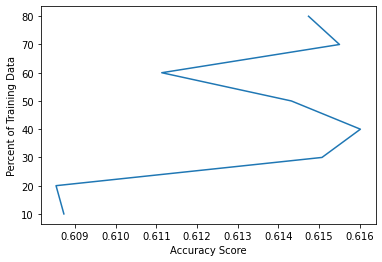

In [74]:
#20% test
x_train, x_test, y_train, y_test = train_test_split(scaled, y_data, test_size = 0.2)
s2=reg.score(x_train, y_train)

#30% test
x_train, x_test, y_train, y_test = train_test_split(scaled, y_data, test_size = 0.3)
s3=reg.score(x_train, y_train)

#40% test
x_train, x_test, y_train, y_test = train_test_split(scaled, y_data, test_size = 0.4)
s4=reg.score(x_train, y_train)

#50% test
x_train, x_test, y_train, y_test = train_test_split(scaled, y_data, test_size = 0.5)
s5=reg.score(x_train, y_train)

#60% test
x_train, x_test, y_train, y_test = train_test_split(scaled, y_data, test_size = 0.6)
s6=reg.score(x_train, y_train)

#70% test
x_train, x_test, y_train, y_test = train_test_split(scaled, y_data, test_size = 0.7)
s7=reg.score(x_train, y_train)

#80% test
x_train, x_test, y_train, y_test = train_test_split(scaled, y_data, test_size = 0.8)
s8=reg.score(x_train, y_train)

#90% test
x_train, x_test, y_train, y_test = train_test_split(scaled, y_data, test_size = 0.9)
s9=reg.score(x_train, y_train)

plt.plot([s2,s3,s4,s5,s6,s7,s8,s9],[80,70,60,50,40,30,20,10])
plt.xlabel('Accuracy Score')
plt.ylabel('Percent of Training Data')
plt.show()

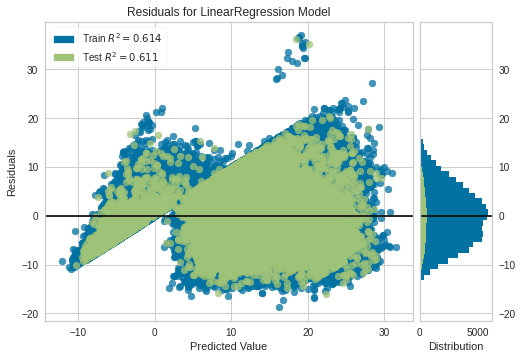

In [84]:
#Residuals
from yellowbrick.regressor import ResidualsPlot
visualizer = ResidualsPlot(reg)
visualizer.fit(x_train, y_train) 
visualizer.score(x_test, y_test) 
visualizer.show() 